Santader customer transaction prediction 

Exploratory Data Analysis includes following steps-

In [1]:
#import libraries
import numpy as np 
import pandas as pd 
import seaborn as sns
import os
import matplotlib.pyplot as plt
import seaborn as sns


In [2]:
#set working directory 
os.chdir("D:\DATA SCIENCE")

In [3]:
#load data
train=pd.read_csv("train.csv")
test=pd.read_csv("test.csv")

In [4]:
#shape of train and test data
train.shape, test.shape

((200000, 202), (200000, 201))

In [5]:
train.columns

Index(['ID_code', 'target', 'var_0', 'var_1', 'var_2', 'var_3', 'var_4',
       'var_5', 'var_6', 'var_7',
       ...
       'var_190', 'var_191', 'var_192', 'var_193', 'var_194', 'var_195',
       'var_196', 'var_197', 'var_198', 'var_199'],
      dtype='object', length=202)

In [6]:
train.dtypes

ID_code     object
target       int64
var_0      float64
var_1      float64
var_2      float64
var_3      float64
var_4      float64
var_5      float64
var_6      float64
var_7      float64
var_8      float64
var_9      float64
var_10     float64
var_11     float64
var_12     float64
var_13     float64
var_14     float64
var_15     float64
var_16     float64
var_17     float64
var_18     float64
var_19     float64
var_20     float64
var_21     float64
var_22     float64
var_23     float64
var_24     float64
var_25     float64
var_26     float64
var_27     float64
            ...   
var_170    float64
var_171    float64
var_172    float64
var_173    float64
var_174    float64
var_175    float64
var_176    float64
var_177    float64
var_178    float64
var_179    float64
var_180    float64
var_181    float64
var_182    float64
var_183    float64
var_184    float64
var_185    float64
var_186    float64
var_187    float64
var_188    float64
var_189    float64
var_190    float64
var_191    f

In [7]:
train.target.value_counts()

0    179902
1     20098
Name: target, dtype: int64

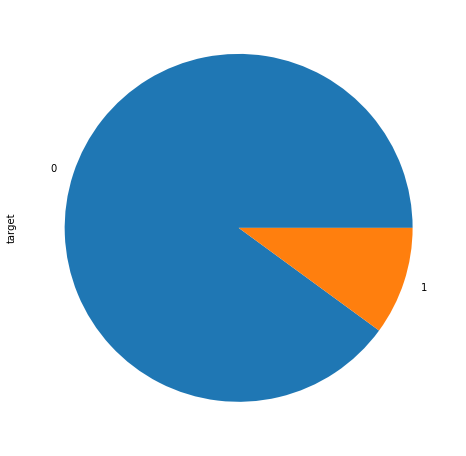

In [8]:
train['target'].value_counts().plot(kind='pie', figsize=(8,8))

#### Typical imbalanced target variable

check for missing values

In [9]:
train.isna().sum().sum()

0

In [10]:
test.isna().sum().sum()

0

#### No missing values!!!

In [11]:
df=train.copy()

In [12]:
# Check for constant columns
df.loc[:, (df != df.iloc[0]).any()].shape
# No constant columns

(200000, 202)

In [13]:
train.describe()

,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,var_190,var_191,var_192,var_193,var_194,var_195,var_196,var_197,var_198,var_199
count,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,...,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000,200000.000000
mean,0.100490,10.679914,-1.627622,10.715192,6.796529,11.078333,-5.065317,5.408949,16.545850,0.284162,...,3.234440,7.438408,1.927839,3.331774,17.993784,-0.142088,2.303335,8.908158,15.870720,-3.326537
std,0.300653,3.040051,4.050044,2.640894,2.043319,1.623150,7.863267,0.866607,3.418076,3.332634,...,4.559922,3.023272,1.478423,3.992030,3.135162,1.429372,5.454369,0.921625,3.010945,10.438015
min,0.000000,0.408400,-15.043400,2.117100,-0.040200,5.074800,-32.562600,2.347300,5.349700,-10.505500,...,-14.093300,-2.691700,-3.814500,-11.783400,8.694400,-5.261000,-14.209600,5.960600,6.299300,-38.852800
25%,0.000000,8.453850,-4.740025,8.722475,5.254075,9.883175,-11.200350,4.767700,13.943800,-2.317800,...,-0.058825,5.157400,0.889775,0.584600,15.629800,-1.170700,-1.946925,8.252800,13.829700,-11.208475
50%,0.000000,10.524750,-1.608050,10.580000,6.825000,11.108250,-4.833150,5.385100,16.456800,0.393700,...,3.203600,7.347750,1.901300,3.396350,17.957950,-0.172700,2.408900,8.888200,15.934050,-2.819550
75%,0.000000,12.758200,1.358625,12.516700,8.324100,12.261125,0.924800,6.003000,19.102900,2.937900,...,6.406200,9.512525,2.949500,6.205800,20.396525,0.829600,6.556725,9.593300,18.064725,4.836800
max,1.000000,20.315000,10.376800,19.353000,13.188300,16.671400,17.251600,8.447700,27.691800,10.151300,...,18.440900,16.716500,8.402400,18.281800,27.928800,4.272900,18.321500,12.000400,26.079100,28.500700


In [14]:
numerical_features=train.columns[2:]

Distribution of Columns


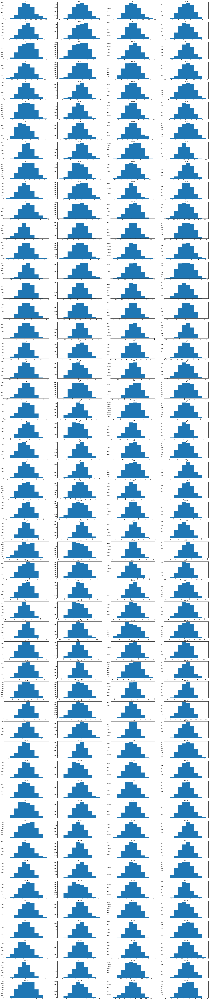

In [15]:
print("Distribution of Columns")
plt.figure(figsize=(40,200))
for i,col in enumerate(numerical_features):
    plt.subplot(50,4,i+1)
    plt.hist(train[col])
    plt.title(col)    

#### Almost all features follow normalised distribution.

distribution of all numerical features per each class.

Distribution of columns


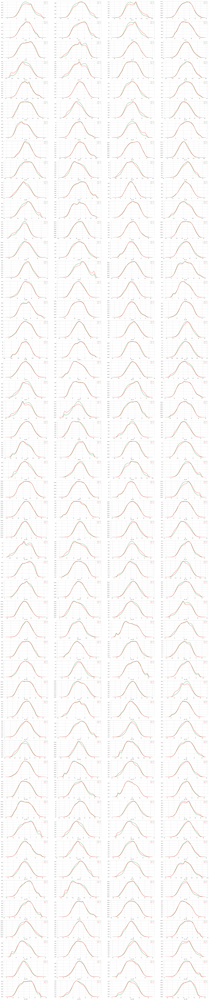

In [16]:
print("Distribution of columns")
sns.set_style('whitegrid')
plt.figure(figsize=(40,200))
for i,col in enumerate(numerical_features):
    plt.subplot(50,4,i+1)
    sns.distplot(train[train['target']==0][col],hist=False,label='0',color='green')
    sns.distplot(train[train['target']==1][col],hist=False,label='1',color='red')
  

#### We can observe that there is a considerable number of features with significant different distribution for the two target values.
For example, var_0, var_1, var_2, var_5, var_9, var_13, var_106, var_109, var_139 and many others.

Also some features, like var_2, var_13, var_26, var_55, var_175, var_184, var_196 shows a distribution that resambles to a bivariate distribution.

Distribution of columns for test and train datset


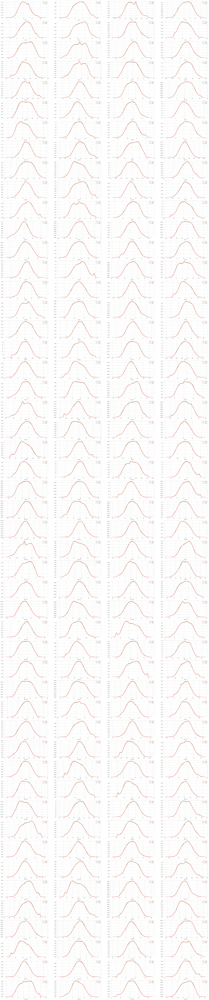

In [17]:
print("Distribution of columns for test and train datset")
sns.set_style('whitegrid')
plt.figure(figsize=(40,200))
for i,col in enumerate(numerical_features):
    plt.subplot(50,4,i+1)
    sns.distplot(train[col],hist=False,label='train',color='green')
    sns.distplot(test[col],hist=False,label='test',color='red')


#### The train and test seems to be well balanced with respect with distribution of the numeric variables.

### Distribution of mean,median,standard deviation,kurtosis frequency, skewness frequency, min, max of train dataset for both targets (0 and 1) both rowwise and columnwise

In [18]:
numerical_features_with_values=train.columns.values[2:202]

In [19]:
train_mean_columnwise_0=list(train[train['target']==0][numerical_features_with_values].mean(axis=0))
train_mean_rowwise_1=list(train[train['target']==1][numerical_features_with_values].mean(axis=1))
train_mean_columnwise_1=list(train[train['target']==1][numerical_features_with_values].mean(axis=0))
train_mean_rowwise_0=list(train[train['target']==0][numerical_features_with_values].mean(axis=1))

In [20]:
train_median_columnwise_0=list(train[train['target']==0][numerical_features_with_values].median(axis=0))
train_median_rowwise_1=list(train[train['target']==1][numerical_features_with_values].median(axis=1))
train_median_columnwise_1=list(train[train['target']==1][numerical_features_with_values].median(axis=0))
train_median_rowwise_0=list(train[train['target']==0][numerical_features_with_values].median(axis=1))

In [21]:
train_std_columnwise_0=list(train[train['target']==0][numerical_features_with_values].std(axis=0))
train_std_rowwise_1=list(train[train['target']==1][numerical_features_with_values].std(axis=1))
train_std_columnwise_1=list(train[train['target']==1][numerical_features_with_values].std(axis=0))
train_std_rowwise_0=list(train[train['target']==0][numerical_features_with_values].std(axis=1))

In [22]:
train_kurt_columnwise_0=list(train[train['target']==0][numerical_features_with_values].kurt(axis=0))
train_kurt_rowwise_1=list(train[train['target']==1][numerical_features_with_values].kurt(axis=1))
train_kurt_columnwise_1=list(train[train['target']==1][numerical_features_with_values].kurt(axis=0))
train_kurt_rowwise_0=list(train[train['target']==0][numerical_features_with_values].kurt(axis=1))

In [23]:
train_skew_columnwise_0=list(train[train['target']==0][numerical_features_with_values].skew(axis=0))
train_skew_rowwise_1=list(train[train['target']==1][numerical_features_with_values].skew(axis=1))
train_skew_columnwise_1=list(train[train['target']==1][numerical_features_with_values].skew(axis=0))
train_skew_rowwise_0=list(train[train['target']==0][numerical_features_with_values].skew(axis=1))

In [24]:
train_min_columnwise_0=list(train[train['target']==0][numerical_features_with_values].min(axis=0))
train_min_rowwise_1=list(train[train['target']==1][numerical_features_with_values].min(axis=1))
train_min_columnwise_1=list(train[train['target']==1][numerical_features_with_values].min(axis=0))
train_min_rowwise_0=list(train[train['target']==0][numerical_features_with_values].min(axis=1))

In [25]:
train_max_columnwise_0=list(train[train['target']==0][numerical_features_with_values].max(axis=0))
train_max_rowwise_1=list(train[train['target']==1][numerical_features_with_values].max(axis=1))
train_max_columnwise_1=list(train[train['target']==1][numerical_features_with_values].max(axis=0))
train_max_rowwise_0=list(train[train['target']==0][numerical_features_with_values].max(axis=1))

In [26]:
def plot_stats_train(x1,x2,aim,wise):
    colors = ['#4E00E6', '#31CF06']
    names = ['target 0','target 1']
    plt.figure(figsize=(25,8))
    plt.hist([x1,x2], bins =120, density=True,
         color = colors, label=names)
    sns.kdeplot(x1,color=colors[0])
    sns.kdeplot(x2,color=colors[1])
    # Plot formatting
    plt.legend()
    plt.xlabel(aim+' values')
    plt.ylabel('Normalized Density')
    plt.title('Distribution of '+aim+' per '+wise+' in train data')

Distribution of mean per column in train

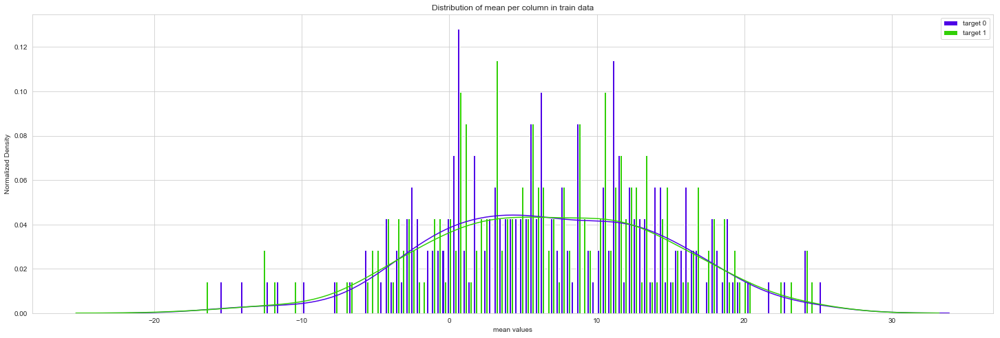

In [27]:
plot_stats_train(train_mean_columnwise_1,train_mean_columnwise_0,'mean',"column")

Distribution of mean per row in train

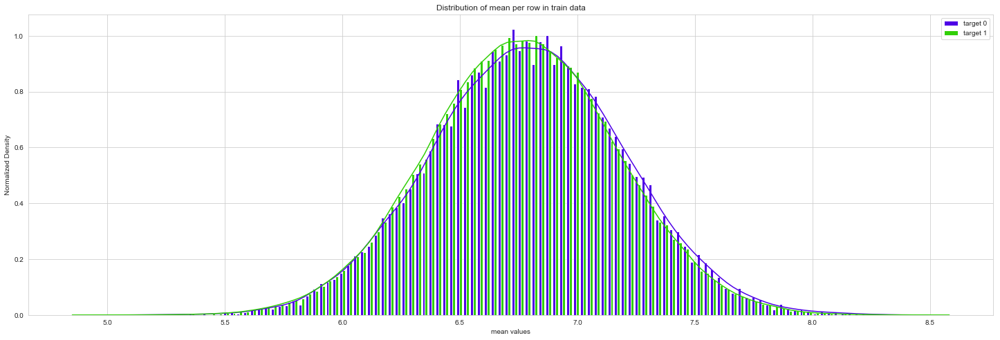

In [28]:
plot_stats_train(train_mean_rowwise_1,train_mean_rowwise_0,'mean',"row")

Distribution of median per column in train

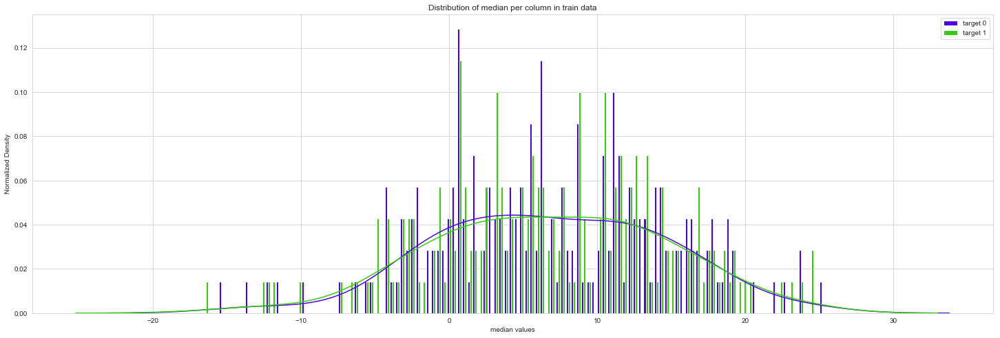

In [29]:
plot_stats_train(train_median_columnwise_1,train_median_columnwise_0,'median',"column")

Distribution of median per row in train

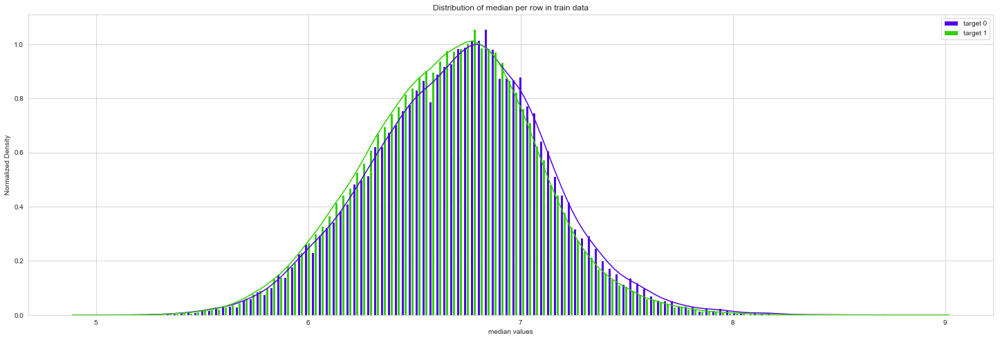

In [30]:
plot_stats_train(train_median_rowwise_1,train_median_rowwise_0,'median',"row")

Distribution of standard deviation per column in train

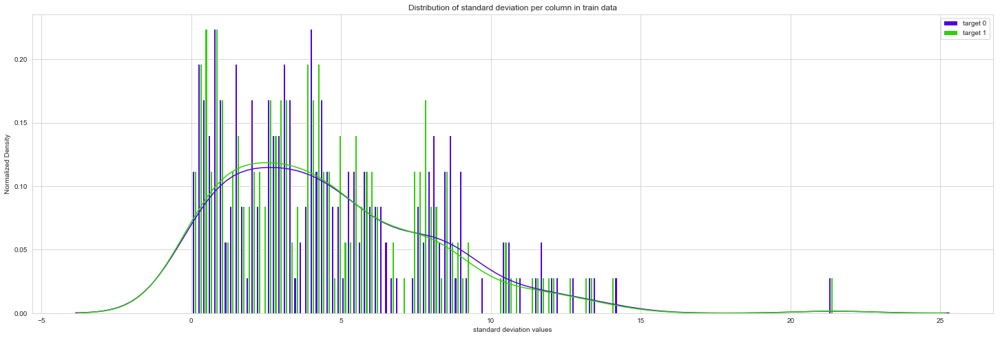

In [31]:
plot_stats_train(train_std_columnwise_1,train_std_columnwise_0,'standard deviation',"column")

Distribution of standard deviation per row in train

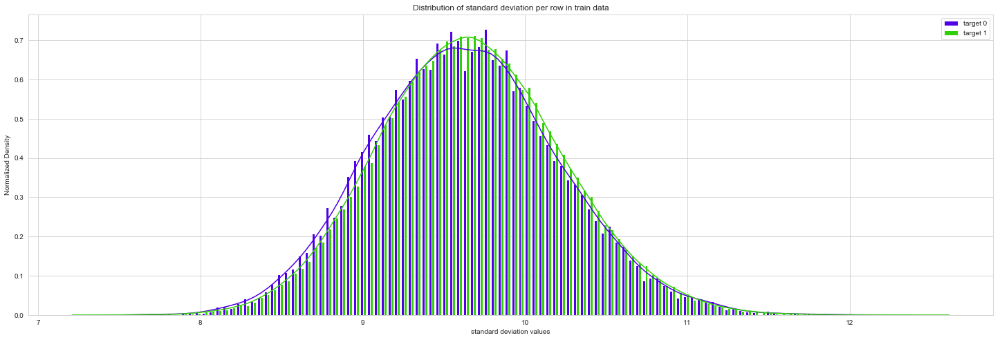

In [32]:
plot_stats_train(train_std_rowwise_1,train_std_rowwise_0,'standard deviation',"row")

Distribution of kurtosis frequency per column in train

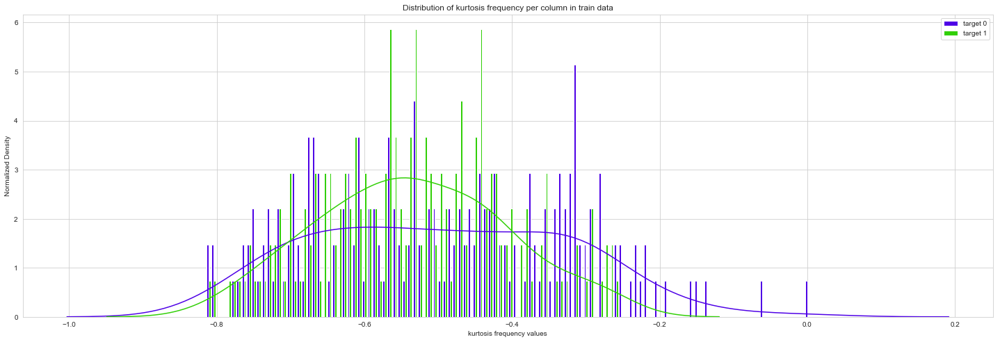

In [33]:
plot_stats_train(train_kurt_columnwise_0,train_kurt_columnwise_1,'kurtosis frequency', 'column')

Distribution of kurtosis frequency per row in train

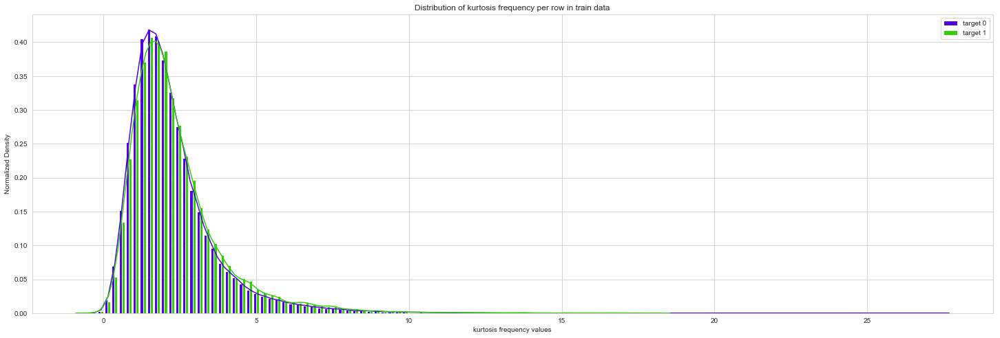

In [34]:
plot_stats_train(train_kurt_rowwise_0,train_kurt_rowwise_1,'kurtosis frequency', 'row')

#### We found the distribution to be Leptokurtic

Distribution of skew frequency per column in train

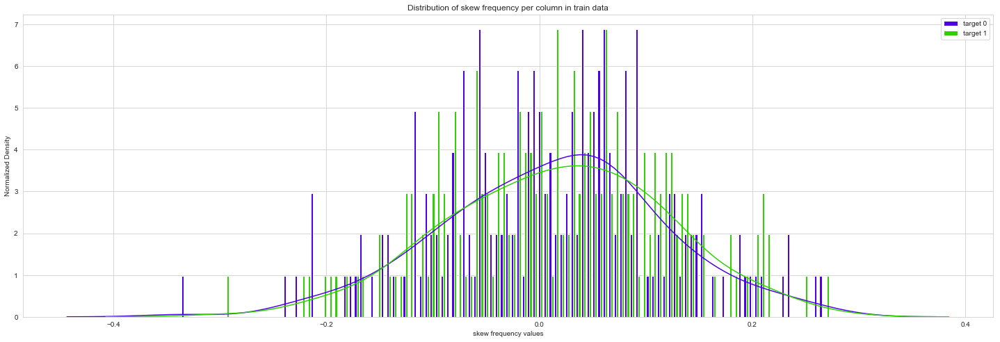

In [35]:
plot_stats_train(train_skew_columnwise_0,train_skew_columnwise_1,'skew frequency', 'column')

Distribution of skew frequency per row in train

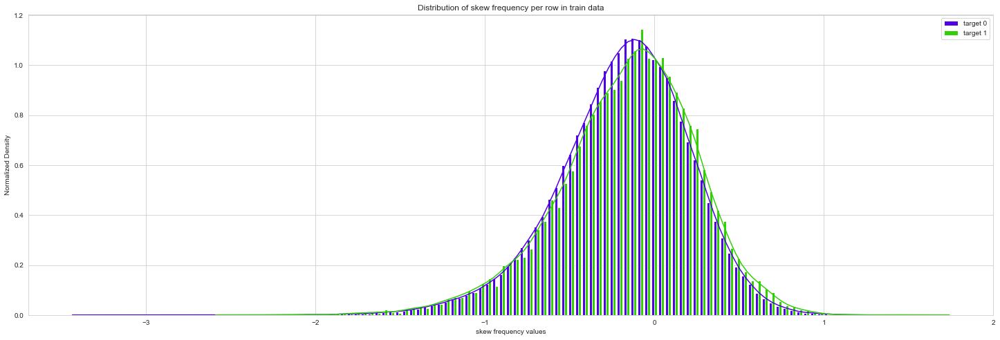

In [36]:
plot_stats_train(train_skew_rowwise_0,train_skew_rowwise_1,'skew frequency', 'row')

#### We found the distribution is left skewed.

Distribution of min per column in train

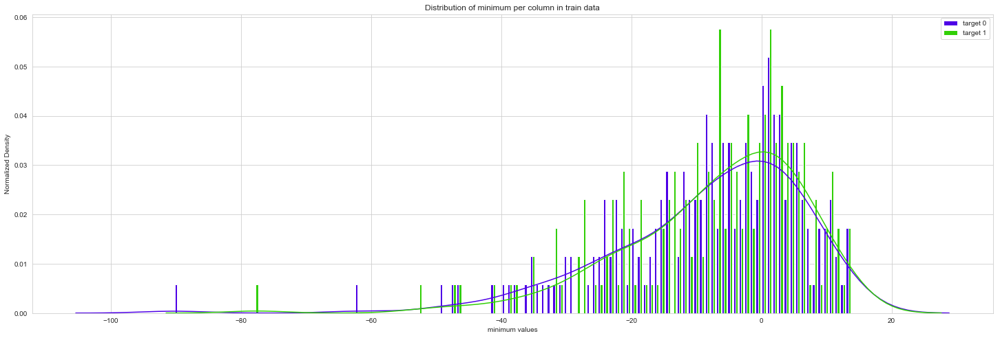

In [37]:
plot_stats_train(train_min_columnwise_0,train_min_columnwise_1,'minimum', 'column')

Distribution of min per row in train

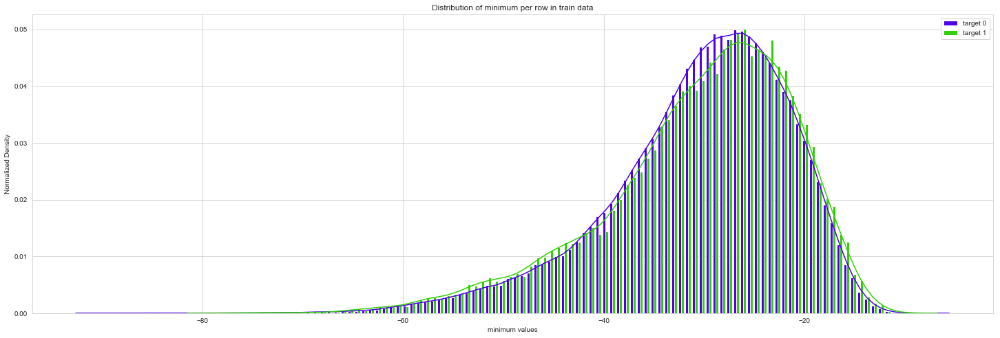

In [38]:
plot_stats_train(train_min_rowwise_0,train_min_rowwise_1,'minimum', 'row')

Distribution of max per column in train

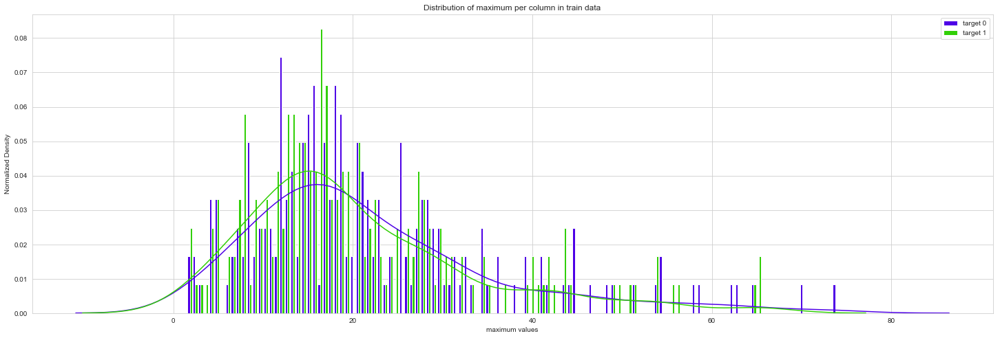

In [39]:
plot_stats_train(train_max_columnwise_0,train_max_columnwise_1,'maximum', 'column')

Distribution of max per row in train

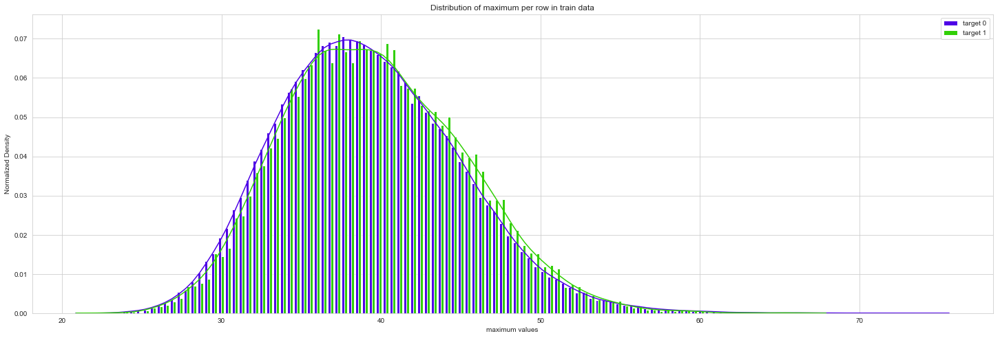

In [40]:
plot_stats_train(train_max_rowwise_0,train_max_rowwise_1,'maximum', 'row')

### Distribution of mean,median,standard deviation,kurtosis frequency, skewness frequency, min, max of test and train datasets both rowwise and columnwise

In [41]:
train_mean_columnwise=list(train[numerical_features_with_values].mean(axis=0))
test_mean_columnwise=list(test[numerical_features_with_values].mean(axis=0))
train_mean_rowwise=list(train[numerical_features_with_values].mean(axis=1))
test_mean_rowwise=list(test[numerical_features_with_values].mean(axis=1))

In [42]:
train_median_columnwise=list(train[numerical_features_with_values].median(axis=0))
test_median_columnwise=list(test[numerical_features_with_values].median(axis=0))
train_median_rowwise=list(train[numerical_features_with_values].median(axis=1))
test_median_rowwise=list(test[numerical_features_with_values].median(axis=1))

In [43]:
train_std_columnwise=list(train[numerical_features_with_values].std(axis=0))
test_std_columnwise=list(test[numerical_features_with_values].std(axis=0))
train_std_rowwise=list(train[numerical_features_with_values].std(axis=1))
test_std_rowwise=list(test[numerical_features_with_values].std(axis=1))

In [44]:
train_kurt_columnwise=list(train[numerical_features_with_values].kurt(axis=0))
test_kurt_columnwise=list(test[numerical_features_with_values].kurt(axis=0))
train_kurt_rowwise=list(train[numerical_features_with_values].kurt(axis=1))
test_kurt_rowwise=list(test[numerical_features_with_values].kurt(axis=1))

In [45]:
train_skew_columnwise=list(train[numerical_features_with_values].skew(axis=0))
test_skew_columnwise=list(test[numerical_features_with_values].skew(axis=0))
train_skew_rowwise=list(train[numerical_features_with_values].skew(axis=1))
test_skew_rowwise=list(test[numerical_features_with_values].skew(axis=1))

In [46]:
train_min_columnwise=list(train[numerical_features_with_values].min(axis=0))
test_min_columnwise=list(test[numerical_features_with_values].min(axis=0))
train_min_rowwise=list(train[numerical_features_with_values].min(axis=1))
test_min_rowwise=list(test[numerical_features_with_values].min(axis=1))

In [47]:
train_max_columnwise=list(train[numerical_features_with_values].max(axis=0))
test_max_columnwise=list(test[numerical_features_with_values].max(axis=0))
train_max_rowwise=list(train[numerical_features_with_values].max(axis=1))
test_max_rowwise=list(test[numerical_features_with_values].max(axis=1))

In [48]:
def plot_stats(x1,x2,aim,wise):
    colors = [ '#FA7201', '#0E7B00']
    names = ['train','test']
    plt.figure(figsize=(25,8))
    plt.hist([x1,x2], bins =120, density=True,
         color = colors, label=names)
    sns.kdeplot(x1,color=colors[0])
    sns.kdeplot(x2,color=colors[1])
    # Plot formatting
    plt.legend()
    plt.xlabel(aim+' values')
    plt.ylabel('Normalized Density')
    plt.title('Distribution of '+aim+' per '+wise+' in test and train data')

Distribution of mean per column in train and test 

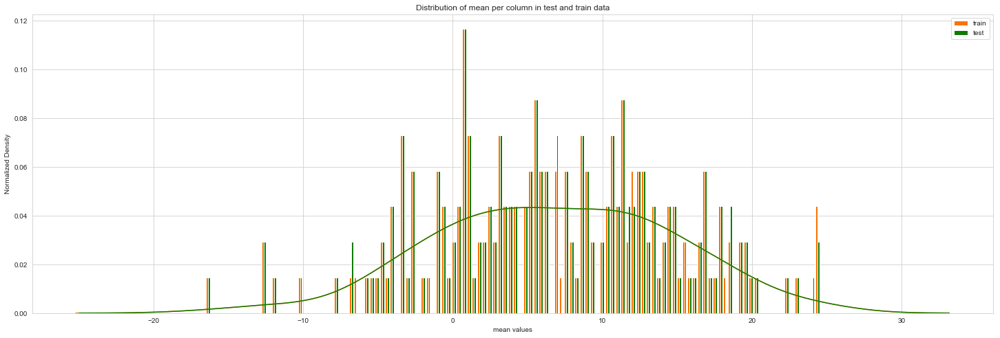

In [49]:
plot_stats(train_mean_columnwise,test_mean_columnwise,'mean','column')

 Distribution of mean per row in train and test

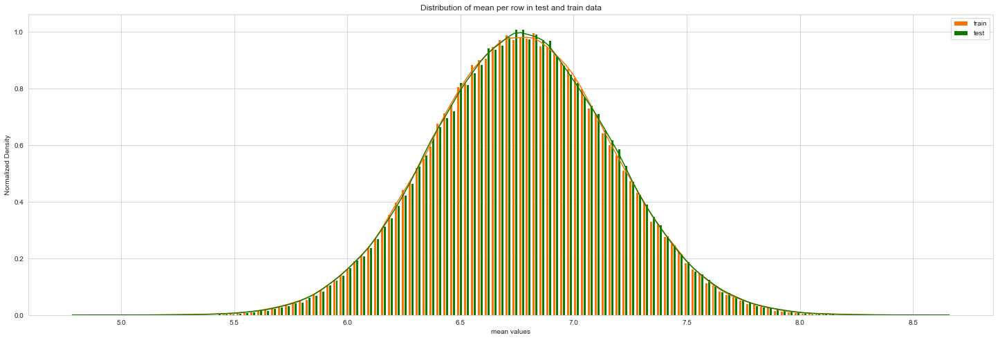

In [50]:
plot_stats(train_mean_rowwise,test_mean_rowwise,'mean','row')

Distribution of median per column in train and test 

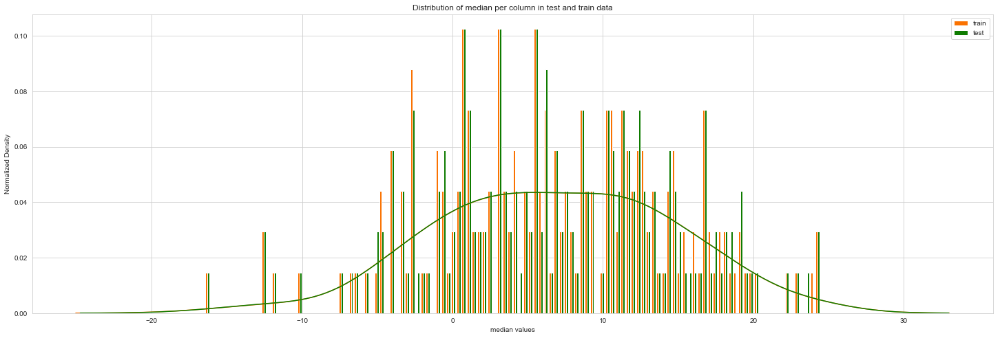

In [51]:
plot_stats(train_median_columnwise,test_median_columnwise,'median','column')

 Distribution of median per row in train and test

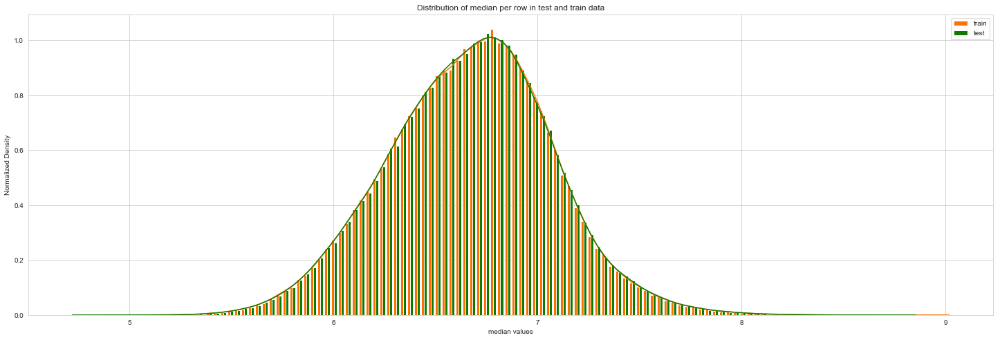

In [52]:
plot_stats(train_median_rowwise,test_median_rowwise,'median','row')

Distribution of standard deviation per column in train and test 

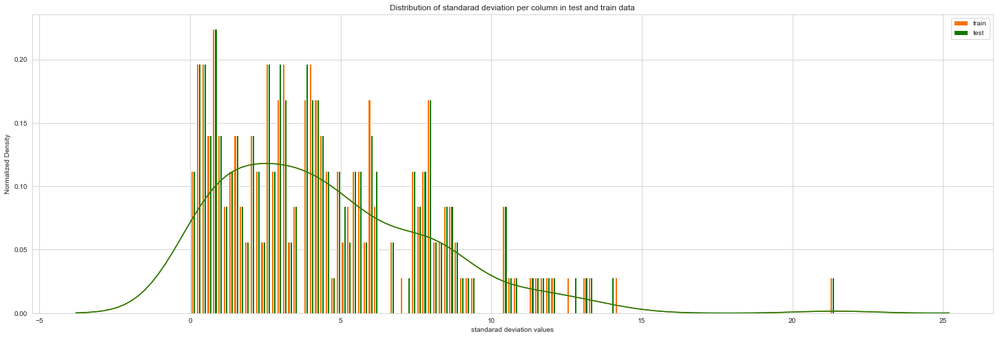

In [53]:
plot_stats(train_std_columnwise,test_std_columnwise,'standarad deviation','column')

Distribution of standard deviation per row in train and test 

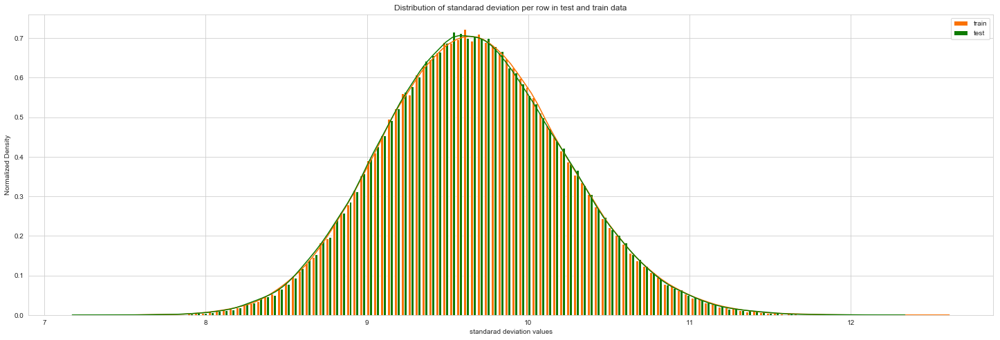

In [54]:
plot_stats(train_std_rowwise,test_std_rowwise,'standarad deviation','row')

Distribution of kurtosis frequency per column in train and test 

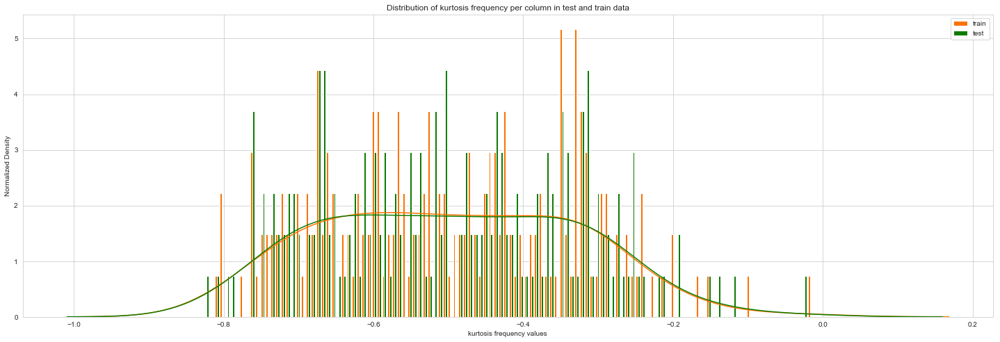

In [55]:
plot_stats(train_kurt_columnwise,test_kurt_columnwise,'kurtosis frequency','column')

Distribution of kurtosis frequency per row in train and test 

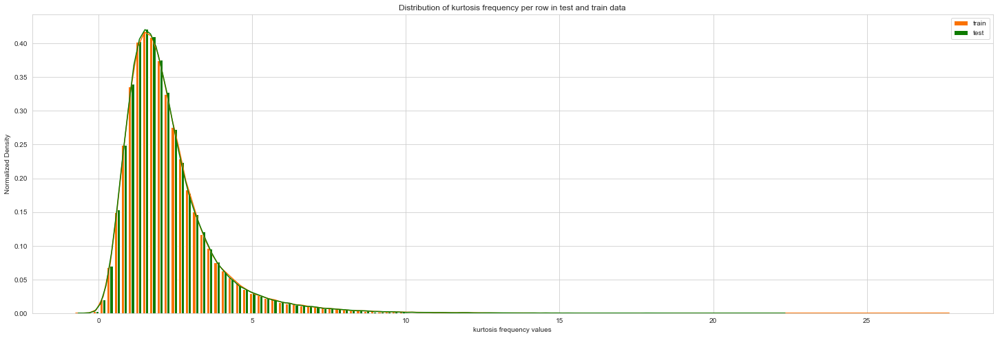

In [56]:
plot_stats(train_kurt_rowwise,test_kurt_rowwise,'kurtosis frequency','row')

Distribution of skew frequency per column in train and test 

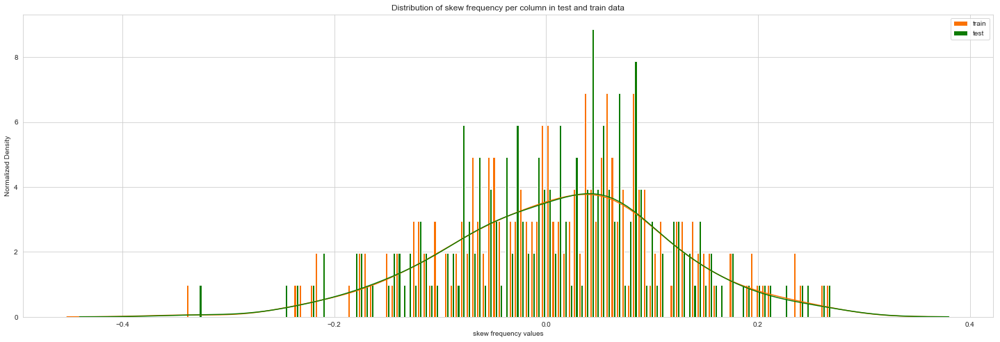

In [57]:
plot_stats(train_skew_columnwise,test_skew_columnwise,'skew frequency','column')

Distribution of skew frequency per row in train and test 

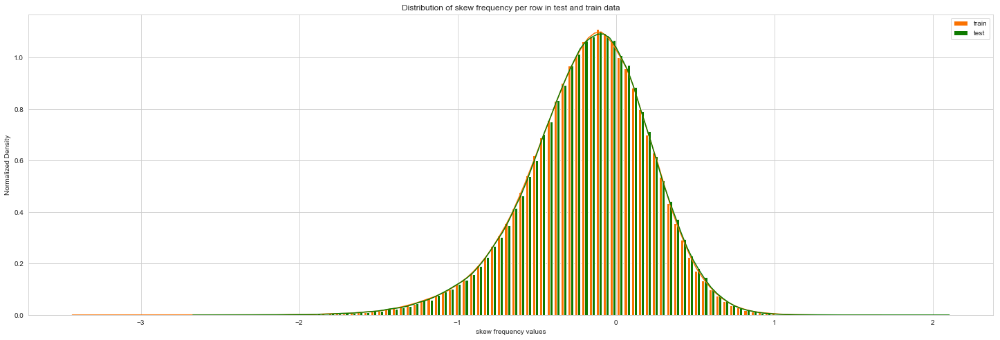

In [58]:
plot_stats(train_skew_rowwise,test_skew_rowwise,'skew frequency','row')

Distribution of min value per column in train and test 

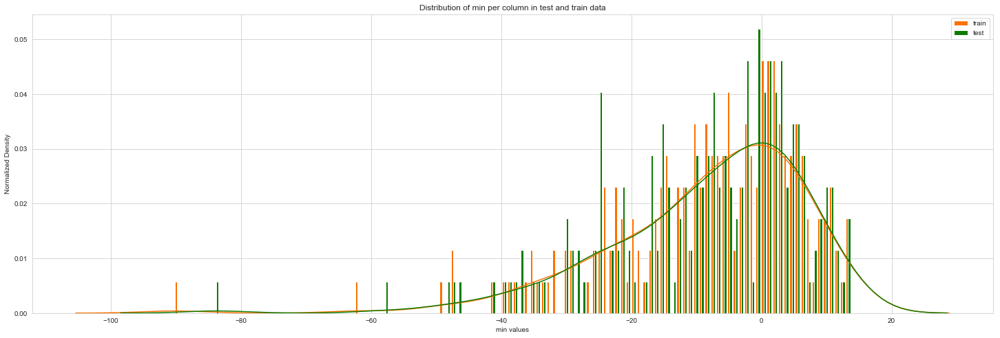

In [59]:
plot_stats(train_min_columnwise,test_min_columnwise,'min','column')

Distribution of min value per row in train and test 

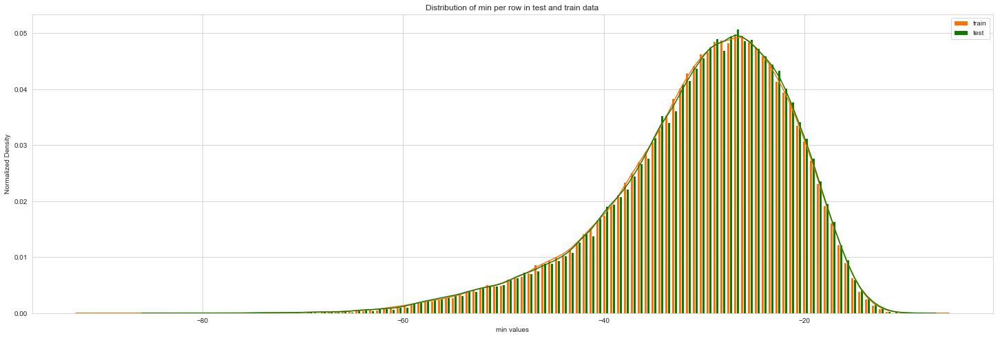

In [60]:
plot_stats(train_min_rowwise,test_min_rowwise,'min','row')

Distribution of max value per column in train and test 

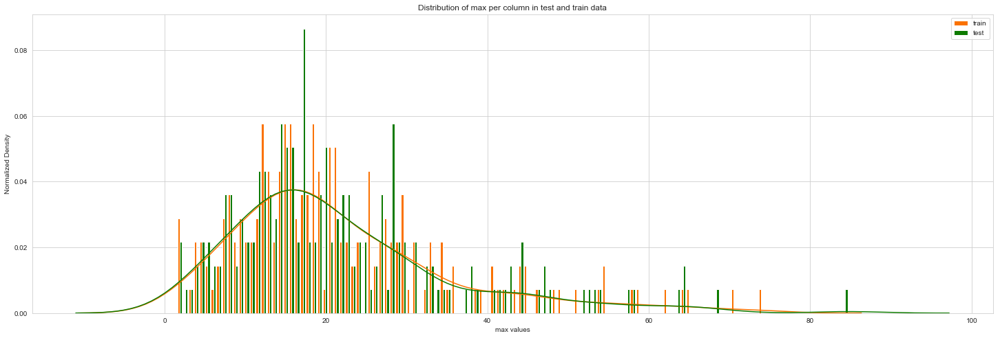

In [61]:
plot_stats(train_max_columnwise,test_max_columnwise,'max','column')

Distribution of max value per row in train and test 

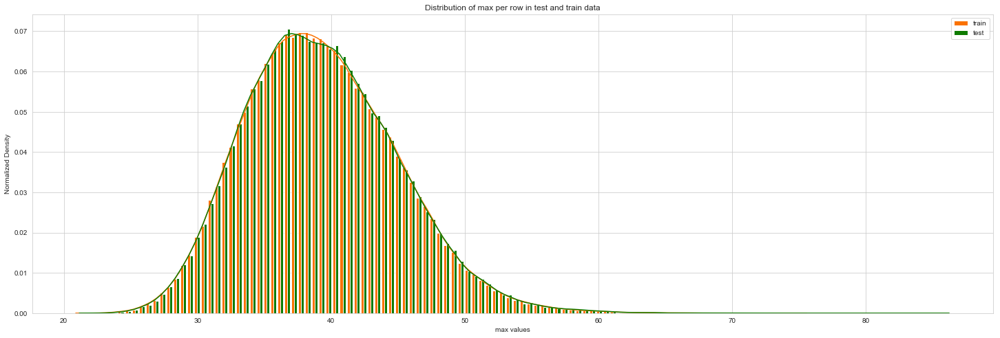

In [62]:
plot_stats(train_max_rowwise,test_max_rowwise,'max','row')

#### We can make few observations here:

#### Standard deviation is relatively large for both train and test variable data;
#### min, max, mean, median, sdt values for train and test data looks quite close;
#### Mean values are distributed over a large range.
#### Moreover mean and median have simmilar distribution.
#### Both train and test are Leptokurtic and negatively skewed.

### Corelation between variables

In [63]:
# Compute the correlation matrix
corr = train[numerical_features].corr()

In [64]:
np.fill_diagonal(corr.values,np.nan)

In [65]:
corr.max().max(),corr.min().min()

(0.009713658349534146, -0.009844361358419677)

 this shows that most of the correlations between the numerical data are close to zero. That means that most of the numerical data are almost uncorrelated between them.

####  We have 200 features that are mostly uncorrelated between them.
#### 200 numerical features that their histograms have a shape like the one of a normal distribution.

In [66]:
df_train=train.copy()

In [67]:
df_test=test.copy()

In [68]:
for df in [df_train,df_test]:
    df['sum'] = df[numerical_features].sum(axis=1)  
    df['min'] = df[numerical_features].min(axis=1)
    df['max'] = df[numerical_features].max(axis=1)
    df['mean'] = df[numerical_features].mean(axis=1)
    df['std'] = df[numerical_features].std(axis=1)
    df['skew'] = df[numerical_features].skew(axis=1)
    df['kurt'] = df[numerical_features].kurtosis(axis=1)
    df['med'] = df[numerical_features].median(axis=1)
    
    for var in numerical_features:
        hist, bin_edges = np.histogram(df[var], bins=1000, density=True)
        df['freq_'+var] = [ hist[np.searchsorted(bin_edges,ele)-1] for ele in df[var]]


In [69]:
df_train.head()

,ID_code,target,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,...,freq_var_190,freq_var_191,freq_var_192,freq_var_193,freq_var_194,freq_var_195,freq_var_196,freq_var_197,freq_var_198,freq_var_199
0,train_0,0,8.9255,-6.7863,11.9081,5.0930,11.4607,-9.2834,5.1187,18.6266,...,0.080684,0.078833,0.202588,0.082820,0.098261,0.083911,0.052258,0.424683,0.075835,0.031327
1,train_1,0,11.5006,-4.1473,13.8588,5.3890,12.3622,7.0433,5.6208,16.5338,...,0.056863,0.119279,0.220596,0.016797,0.101121,0.089680,0.051797,0.373357,0.101113,0.034000
2,train_2,0,8.6093,-2.7457,12.0805,7.8928,10.5825,-9.0837,6.9427,14.6155,...,0.083604,0.099443,0.253747,0.088641,0.079285,0.061884,0.026590,0.361767,0.110466,0.031327
3,train_3,0,11.0604,-2.1518,8.9522,7.1957,12.5846,-1.8361,5.8428,14.9250,...,0.080223,0.113869,0.190719,0.084150,0.054850,0.227609,0.046417,0.171363,0.106674,0.029546
4,train_4,0,9.8369,-1.4834,12.8746,6.6375,12.2772,2.4486,5.9405,19.2514,...,0.055019,0.099443,0.115823,0.037918,0.054590,0.200862,0.058252,0.351833,0.101113,0.028061


In [70]:
df_test.head()

,ID_code,var_0,var_1,var_2,var_3,var_4,var_5,var_6,var_7,var_8,...,freq_var_190,freq_var_191,freq_var_192,freq_var_193,freq_var_194,freq_var_195,freq_var_196,freq_var_197,freq_var_198,freq_var_199
0,test_0,11.0656,7.7798,12.9536,9.4292,11.4327,-2.3805,5.8493,18.2675,2.1337,...,0.044990,0.045494,0.016746,0.100187,0.048748,0.059742,0.061443,0.082703,0.119773,0.026572
1,test_1,8.5304,1.2543,11.3047,5.1858,9.1974,-4.0117,6.0196,18.6316,-4.4131,...,0.023075,0.131514,0.224751,0.029953,0.088608,0.249543,0.056923,0.308703,0.086447,0.010911
2,test_2,5.4827,-10.3581,10.1407,7.0479,10.2628,9.8052,4.8950,20.2537,1.5233,...,0.072999,0.074254,0.285566,0.086588,0.038513,0.087763,0.028964,0.067964,0.059636,0.008090
3,test_3,8.5374,-1.3222,12.0220,6.5749,8.8458,3.1744,4.9397,20.5660,3.3755,...,0.036137,0.125239,0.270582,0.107245,0.100727,0.077718,0.064290,0.357833,0.077176,0.033177
4,test_4,11.7058,-0.1327,14.1295,7.7506,9.1035,-8.5848,6.8595,10.6048,2.9890,...,0.078950,0.116349,0.245904,0.106040,0.099111,0.270162,0.043027,0.076971,0.109750,0.030283


In [71]:
df_train.shape,df_test.shape

((200000, 410), (200000, 409))

In [72]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
import lightgbm as lgb
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm
from sklearn.model_selection import StratifiedKFold

In [73]:
y = train['target']
x = train.drop(['target', "ID_code"], axis=1)

In [74]:
X_train, X_test, Y_train, Y_test =train_test_split(x, y, stratify = y, random_state=42, test_size=0.3)

In [75]:
mode_target=Y_train.mode()
mode_target

0    0
dtype: int64

In [76]:
baseline_pred=np.repeat(mode_target,Y_test.shape[0])
baseline_auc_score=roc_auc_score(Y_test,baseline_pred)
base_acu=accuracy_score(baseline_pred, Y_test)
base_pre=precision_score(baseline_pred, Y_test)
base_rec=recall_score(baseline_pred, Y_test)
base_f1=f1_score(baseline_pred, Y_test)
print("AUC Score for Baseline Prediction is ",baseline_auc_score)
print("Accuracy Score for Baseline Prediction is ",base_acu)
print("Precision Score for Baseline Prediction is ",base_pre)
print("Recall Score for Baseline prediction is ",base_rec)
print("f1 Score for Baseline Prediction is ",base_f1)

AUC Score for Baseline Prediction is  0.5
Accuracy Score for Baseline Prediction is  0.8995166666666666
Precision Score for Baseline Prediction is  0.0
Recall Score for Baseline prediction is  0.0
f1 Score for Baseline Prediction is  0.0


C:\Users\LENOVO\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples.
  'recall', 'true', average, warn_for)
C:\Users\LENOVO\Anaconda3\lib\site-packages\sklearn\metrics\classification.py:1145: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 due to no true samples.
  'recall', 'true', average, warn_for)


In [77]:
lom = LogisticRegression()
lom.fit(X_train,Y_train)
Y_pred=lom.predict(X_test)

C:\Users\LENOVO\Anaconda3\lib\site-packages\sklearn\linear_model\logistic.py:433: FutureWarning: Default solver will be changed to 'lbfgs' in 0.22. Specify a solver to silence this warning.
  FutureWarning)


In [78]:
lom_acu=accuracy_score(Y_pred, Y_test)
lom_pre=precision_score(Y_pred, Y_test)
lom_rec=recall_score(Y_pred, Y_test)
lom_f1=f1_score(Y_pred, Y_test)
lom_auc_score=roc_auc_score(Y_pred, Y_test)
print("AUC Score for Logistic Regression is ",lom_auc_score)
print("Accuracy Score for Logistic Regression is ",lom_acu)
print("Precision Score for Logistic Regression is ",lom_pre)
print("Recall Score for Logistic Regression is ",lom_rec)
print("f1 Score for Logistic Regression is ",lom_f1)

AUC Score for Logistic Regression is  0.7992403168703466
Accuracy Score for Logistic Regression is  0.9133166666666667
Precision Score for Logistic Regression is  0.26438878752695305
Recall Score for Logistic Regression is  0.6754237288135593
f1 Score for Logistic Regression is  0.38002145666944803


In [79]:
NB=GaussianNB()
NB.fit(X_train,Y_train)
NB_Y_pred=NB.predict(X_test)              

In [80]:
NB_acu=accuracy_score(NB_Y_pred, Y_test)
NB_pre=precision_score(NB_Y_pred, Y_test)
NB_rec=recall_score(NB_Y_pred, Y_test)
NB_f1=f1_score(NB_Y_pred, Y_test)
NB_auc_score=roc_auc_score(NB_Y_pred, Y_test)
print("AUC Score for Naive Bayes is ",NB_auc_score)
print("Accuracy Score for Naive Bayes is ",NB_acu)
print("Precision Score for  is Naive Bayes is ",NB_pre)
print("Recall Score for Naive Bayes is ",NB_rec)
print("f1 Score for Naive Bayes is ",NB_f1)

AUC Score for Naive Bayes is  0.8173001766414567
Accuracy Score for Naive Bayes is  0.9197833333333333
Precision Score for  is Naive Bayes is  0.34864820036490296
Recall Score for Naive Bayes is  0.7034805890227577
f1 Score for Naive Bayes is  0.4662304535876677


In [81]:
svm_m = svm.LinearSVC() 
svm_m.fit(X_train,Y_train)
svm_Y_pred=svm_m.predict(X_test)     

C:\Users\LENOVO\Anaconda3\lib\site-packages\sklearn\svm\base.py:931: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


In [82]:
SVM_acu=accuracy_score(svm_Y_pred, Y_test)
SVM_pre=precision_score(svm_Y_pred, Y_test)
SVM_rec=recall_score(svm_Y_pred, Y_test)
SVM_f1=f1_score(svm_Y_pred, Y_test)
SVM_auc_score=roc_auc_score(svm_Y_pred, Y_test)
print("AUC Score for SVM is ",SVM_auc_score)
print("Accuracy Score for SVM is ",SVM_acu)
print("Precision Score for  SVM is ",SVM_pre)
print("Recall Score for SVM is ",SVM_rec)
print("f1 Score for SVM is ",SVM_f1)

AUC Score for SVM is  0.5871643478611704
Accuracy Score for SVM is  0.66465
Precision Score for  SVM is  0.8143970807762482
Recall Score for SVM is  0.20533623285379726
f1 Score for SVM is  0.3279783574362914


In [83]:
Y_train.value_counts()
T=200000
P=20098
scale_pos_weight = T/P - 1

scale_pos_weight

8.951238929246692

In [84]:
class_weight={0: 1, 1: 50}
rf = RandomForestClassifier(class_weight=class_weight,bootstrap=True,n_estimators = 100, random_state = 883,n_jobs=-1)
rf.fit(X_train,Y_train)
rf_pred= rf.predict(X_test)

In [85]:
rf_acu=accuracy_score(rf_pred, Y_test)
rf_pre=precision_score(rf_pred, Y_test)
rf_rec=recall_score(rf_pred, Y_test)
rf_f1=f1_score(rf_pred, Y_test)
try:
    rf_auc_score=roc_auc_score(rf_pred, Y_test)
except ValueError:
    pass

print("AUC Score for RandomForest is ",rf_auc_score)
print("Accuracy Score for RandomForest is ",rf_acu)
print("Precision Score for  RandomForest is ",rf_pre)
print("Recall Score for RandomForest is ",rf_rec)
print("f1 Score for RandomForest is ",rf_f1)

AUC Score for RandomForest is  0.549762480206684
Accuracy Score for RandomForest is  0.8994666666666666
Precision Score for  RandomForest is  0.0001658649859014762
Recall Score for RandomForest is  0.2
f1 Score for RandomForest is  0.00033145508783559825


In [86]:
np.unique(rf_pred)

array([0, 1], dtype=int64)

In [87]:
train_data=lgb.Dataset(X_train,label=Y_train)
test_data=lgb.Dataset(X_test,label=Y_test)

In [88]:
#0    179902
#1     20098
# T - no. of total samples
# P - no. of positive samples
# scale_pos_weight = percent of negative / percent of positive
# which translates to:
# scale_pos_weight = (100*(T-P)/T) / (100*P/T)
# which further simplifies to :
T=200000
P=20098
scale_pos_weight = T/P - 1

scale_pos_weight

8.951238929246692

In [89]:
params = {}
params['learning_rate'] = 0.01
params['boosting_type'] = 'gbdt'
params['objective'] = 'binary'
params['metric'] = 'auc'
params['sub_feature'] = 0.5
params['num_leaves'] = 31
params['min_data'] = 80
params['max_depth'] = -1
params['scale_pos_weight']=scale_pos_weight
num_round=5000
clf = lgb.train(params, train_data, num_round, valid_sets=[train_data, test_data], 
                     valid_names=['train','test'],verbose_eval=100, early_stopping_rounds = 30)

Training until validation scores don't improve for 30 rounds.
[100]	train's auc: 0.840438	test's auc: 0.801218
[200]	train's auc: 0.866006	test's auc: 0.821993
[300]	train's auc: 0.883825	test's auc: 0.836168
[400]	train's auc: 0.89769	test's auc: 0.84678
[500]	train's auc: 0.908239	test's auc: 0.854899
[600]	train's auc: 0.916788	test's auc: 0.860915
[700]	train's auc: 0.923867	test's auc: 0.865868
[800]	train's auc: 0.929828	test's auc: 0.869784
[900]	train's auc: 0.934945	test's auc: 0.872956
[1000]	train's auc: 0.939426	test's auc: 0.87575
[1100]	train's auc: 0.943383	test's auc: 0.87808
[1200]	train's auc: 0.946915	test's auc: 0.879968
[1300]	train's auc: 0.950128	test's auc: 0.881793
[1400]	train's auc: 0.953001	test's auc: 0.883285
[1500]	train's auc: 0.955564	test's auc: 0.884519
[1600]	train's auc: 0.957915	test's auc: 0.885569
[1700]	train's auc: 0.960161	test's auc: 0.886665
[1800]	train's auc: 0.962213	test's auc: 0.887588
[1900]	train's auc: 0.964077	test's auc: 0.888389
[

In [90]:
lgb_pred=clf.predict(X_test)

In [91]:
gbm = lgb.LGBMClassifier(objective='binary',
                         num_estimators=5000,
                         scale_pos_weight=scale_pos_weight,
                        num_leaves=31,
                        metric = 'auc',num_round=5000)

In [92]:
gbm.fit(X_train, Y_train,
        eval_set=[(X_test, Y_test)],
        eval_metric=['auc'],
early_stopping_rounds=30)

C:\Users\LENOVO\Anaconda3\lib\site-packages\lightgbm\engine.py:118: UserWarning: Found `num_round` in params. Will use it instead of argument
  warnings.warn("Found `{}` in params. Will use it instead of argument".format(alias))


[1]	valid_0's auc: 0.663252
Training until validation scores don't improve for 30 rounds.
[2]	valid_0's auc: 0.692887
[3]	valid_0's auc: 0.716237
[4]	valid_0's auc: 0.728176
[5]	valid_0's auc: 0.743909
[6]	valid_0's auc: 0.75247
[7]	valid_0's auc: 0.757769
[8]	valid_0's auc: 0.762642
[9]	valid_0's auc: 0.767714
[10]	valid_0's auc: 0.774263
[11]	valid_0's auc: 0.779376
[12]	valid_0's auc: 0.782346
[13]	valid_0's auc: 0.78548
[14]	valid_0's auc: 0.787721
[15]	valid_0's auc: 0.791418
[16]	valid_0's auc: 0.795026
[17]	valid_0's auc: 0.797789
[18]	valid_0's auc: 0.800168
[19]	valid_0's auc: 0.802812
[20]	valid_0's auc: 0.805036
[21]	valid_0's auc: 0.806846
[22]	valid_0's auc: 0.808315
[23]	valid_0's auc: 0.81001
[24]	valid_0's auc: 0.812455
[25]	valid_0's auc: 0.814227
[26]	valid_0's auc: 0.815568
[27]	valid_0's auc: 0.816473
[28]	valid_0's auc: 0.818254
[29]	valid_0's auc: 0.819775
[30]	valid_0's auc: 0.820857
[31]	valid_0's auc: 0.822735
[32]	valid_0's auc: 0.82457
[33]	valid_0's auc: 0.8

[278]	valid_0's auc: 0.884649
[279]	valid_0's auc: 0.884672
[280]	valid_0's auc: 0.884688
[281]	valid_0's auc: 0.88468
[282]	valid_0's auc: 0.884692
[283]	valid_0's auc: 0.884741
[284]	valid_0's auc: 0.88475
[285]	valid_0's auc: 0.884799
[286]	valid_0's auc: 0.884796
[287]	valid_0's auc: 0.884814
[288]	valid_0's auc: 0.884853
[289]	valid_0's auc: 0.884861
[290]	valid_0's auc: 0.884941
[291]	valid_0's auc: 0.884989
[292]	valid_0's auc: 0.885011
[293]	valid_0's auc: 0.885041
[294]	valid_0's auc: 0.885092
[295]	valid_0's auc: 0.885125
[296]	valid_0's auc: 0.885159
[297]	valid_0's auc: 0.885184
[298]	valid_0's auc: 0.885223
[299]	valid_0's auc: 0.885313
[300]	valid_0's auc: 0.885313
[301]	valid_0's auc: 0.885359
[302]	valid_0's auc: 0.885424
[303]	valid_0's auc: 0.885416
[304]	valid_0's auc: 0.88542
[305]	valid_0's auc: 0.885443
[306]	valid_0's auc: 0.885443
[307]	valid_0's auc: 0.885439
[308]	valid_0's auc: 0.885462
[309]	valid_0's auc: 0.885536
[310]	valid_0's auc: 0.885539
[311]	valid_0

LGBMClassifier(boosting_type='gbdt', class_weight=None, colsample_bytree=1.0,
        importance_type='split', learning_rate=0.1, max_depth=-1,
        metric='auc', min_child_samples=20, min_child_weight=0.001,
        min_split_gain=0.0, n_estimators=100, n_jobs=-1,
        num_estimators=5000, num_leaves=31, num_round=5000,
        objective='binary', random_state=None, reg_alpha=0.0,
        reg_lambda=0.0, scale_pos_weight=8.951238929246692, silent=True,
        subsample=1.0, subsample_for_bin=200000, subsample_freq=0)

AttributeError: 'tuple' object has no attribute 'plot'

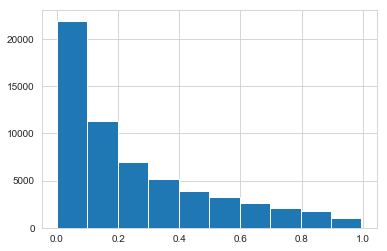

In [93]:
hp=plt.hist(gbm.predict_proba(X_test)[:,1])
hp.plot

In [ ]:
lgb_pred2=list(np.zeros(len(X_test)))

In [ ]:
#Output will be a list of probabilities.
# setting threshold to .5

for i in range(0,len(lgb_pred)):
    if lgb_pred[i]>=.8:     
       lgb_pred2[i]=1
    else:  
       lgb_pred2[i]=0

In [ ]:
lgb_acu=accuracy_score(lgb_pred2, Y_test)
lgb_pre=precision_score(lgb_pred2, Y_test)
lgb_rec=recall_score(lgb_pred2, Y_test)
lgb_f1=f1_score(lgb_pred2, Y_test)
lgb_auc_score=roc_auc_score(lgb_pred2, Y_test)


print("AUC Score for LightGBM is ",lgb_auc_score)
print("Accuracy Score for LightGBM is ",lgb_acu)
print("Precision Score for  LightGBM is ",lgb_pre)
print("Recall Score for LightGBM is ",lgb_rec)
print("f1 Score for LightGBM is ",lgb_f1)

In [ ]:
model_pred=pd.DataFrame()
model_pred['model_name']=['Logistic Regression','Random Forest','Light GBM','Naive Bayes','SVM',]
model_pred['AUC Score']=[lom_auc_score,rf_auc_score,lgb_auc_score,NB_auc_score,SVM_auc_score]
model_pred['Accuracy']=[lom_acu,rf_acu,lgb_acu,NB_acu,SVM_acu]
model_pred['Precision']=[lom_pre,rf_pre,lgb_pre,NB_pre,SVM_pre]
model_pred['Recall']=[lom_rec,rf_rec,lgb_rec,NB_rec,SVM_rec]
model_pred['F1 Score']=[lom_f1,rf_f1,lgb_f1,NB_f1,SVM_f1]

In [ ]:
model_pred

choosing lightGBM as final model

In [ ]:
y_ = df_train['target']
x_ = df_train.drop(['target', "ID_code"], axis=1)

In [ ]:
x_train, x_test, y_train, y_test =train_test_split(x_, y_, stratify = y_, random_state=42, test_size=0.3)

In [ ]:
y_train.value_counts()

In [ ]:
train_data=lgb.Dataset(x_train,label=y_train)
test_data=lgb.Dataset(x_test,label=y_test)

In [ ]:
params = {}
params['learning_rate'] = 0.01
params['boosting_type'] = 'gbdt'
params['objective'] = 'binary'
params['metric'] = 'auc'
params['sub_feature'] = 0.5
params['num_leaves'] = 31
params['min_data'] = 80
params['max_depth'] = -1
params['scale_pos_weight']=scale_pos_weight
num_round=5000
clf_ = lgb.train(params, train_data, num_round, valid_sets=[train_data, test_data], 
                     valid_names=['train','test'],verbose_eval=100, early_stopping_rounds = 30)

In [ ]:
lgb_pred_=clf_.predict(x_test)

In [ ]:
gbm = lgb.LGBMClassifier(objective='binary',
                         num_estimators=5000,
                         scale_pos_weight=scale_pos_weight,
                        num_leaves=31,
                        metric = 'auc',num_round=5000)

In [ ]:
gbm.fit(x_train, y_train,
        eval_set=[(x_test, y_test)],
        eval_metric=['auc'],
early_stopping_rounds=30)

In [ ]:
hp=plt.hist(gbm.predict_proba(x_test)[:,1])
hp.plot

In [ ]:
lgb_pred2=list(np.zeros(len(x_test)))

In [ ]:
#Output will be a list of probabilities.
# setting threshold to .5

for i in range(0,len(lgb_pred_)):
    if lgb_pred_[i]>=.8:     
       lgb_pred2[i]=1
    else:  
       lgb_pred2[i]=0

In [ ]:
lgb_acu=accuracy_score(lgb_pred2, Y_test)
lgb_pre=precision_score(lgb_pred2, Y_test)
lgb_rec=recall_score(lgb_pred2, Y_test)
lgb_f1=f1_score(lgb_pred2, Y_test)
lgb_auc_score=roc_auc_score(lgb_pred2, Y_test)


print("AUC Score for LightGBM is ",lgb_auc_score)
print("Accuracy Score for LightGBM is ",lgb_acu)
print("Precision Score for  LightGBM is ",lgb_pre)
print("Recall Score for LightGBM is ",lgb_rec)
print("f1 Score for LightGBM is ",lgb_f1)

tuning LightGBM Parameters

In [ ]:
param = {
    'bagging_freq': 5,
    'bagging_fraction': 0.4,
    'boost_from_average':'false',
    'boost': 'gbdt',
    'feature_fraction': 0.05,
    'learning_rate': 0.01,
    'max_depth': -1,  
    'metric':'auc',
    'min_data_in_leaf': 80,
    'min_sum_hessian_in_leaf': 10.0,
    'num_leaves': 8,
    'num_threads': 8,
    'tree_learner': 'serial',
    'objective': 'binary', 
    'verbosity': 1,
    "scale_pos_weight":scale_pos_weight
}

In [ ]:
num_round = 1000000
clf_ = lgb.train(param, train_data, num_round, valid_sets=[train_data, test_data], 
                     valid_names=['train','test'],verbose_eval=1000, early_stopping_rounds = 3000)

In [ ]:
lgb_pred__=clf_.predict(x_test)

In [ ]:
gbm = lgb.LGBMClassifier(objective='binary',
                         num_estimators=num_round,
                         scale_pos_weight=scale_pos_weight,
                        num_leaves=8,
                        metric = 'auc',num_round=num_round)

In [ ]:
gbm.fit(x_train, y_train,
        eval_set=[(x_test, y_test)],
        eval_metric=['auc'],
early_stopping_rounds=30)

In [ ]:
plt.hist(gbm.predict_proba(x_test)[:,1])


In [ ]:
for i in range(0,len(lgb_pred__)):
    if lgb_pred__[i]>=.65:     
       lgb_pred2[i]=1
    else:  
       lgb_pred2[i]=0

In [ ]:
lgb_acu=accuracy_score(lgb_pred2, y_test)
lgb_pre=precision_score(lgb_pred2, y_test)
lgb_rec=recall_score(lgb_pred2, y_test)
lgb_f1=f1_score(lgb_pred2, y_test)
lgb_auc_score=roc_auc_score(lgb_pred2, y_test)


print("AUC Score for LightGBM is ",lgb_auc_score)
print("Accuracy Score for LightGBM is ",lgb_acu)
print("Precision Score for  LightGBM is ",lgb_pre)
print("Recall Score for LightGBM is ",lgb_rec)
print("f1 Score for LightGBM is ",lgb_f1)

In [ ]:
lgbm_feature_importance=sorted(zip(map(lambda x: round(x, 4),clf_.feature_importance()), x_train.columns),reverse=True)
plt.figure(figsize=(64,64))
sns.barplot([imp for imp,feature in lgbm_feature_importance],[feature for imp,feature in lgbm_feature_importance])

In [ ]:
features = [c for c in df_train.columns if c not in ['ID_code', 'target']]
target = df_train['target']

In [ ]:
folds = StratifiedKFold(n_splits=10, shuffle=False, random_state=44000)
oof = np.zeros(len(df_train))
predictions = np.zeros(len(df_test))
feature_importance_df = pd.DataFrame()

for fold_, (trn_idx, val_idx) in enumerate(folds.split(df_train.values, target.values)):
    print("Fold {}".format(fold_))
    trn_data = lgb.Dataset(df_train.iloc[trn_idx][features], label=target.iloc[trn_idx])
    val_data = lgb.Dataset(df_train.iloc[val_idx][features], label=target.iloc[val_idx])

    num_round = 1000000
    clf = lgb.train(param, trn_data, num_round, valid_sets = [trn_data, val_data], verbose_eval=1000, early_stopping_rounds = 3000)
    oof[val_idx] = clf.predict(df_train.iloc[val_idx][features], num_iteration=clf.best_iteration)
    
    fold_importance_df = pd.DataFrame()
    fold_importance_df["Feature"] = features
    fold_importance_df["importance"] = clf.feature_importance()
    fold_importance_df["fold"] = fold_ + 1
    feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
    
    predictions += clf.predict(df_test[features], num_iteration=clf.best_iteration) / folds.n_splits

print("CV score: {:<8.5f}".format(roc_auc_score(target, oof)))